In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras.models import Model
from keras.optimizers import Adam
from keras.losses import MeanSquaredError
from keras.layers import Input, Conv2D, Add, Concatenate, Activation, GlobalAveragePooling2D, Multiply
from keras.models import save_model, load_model

import matplotlib.pyplot as plt


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
#get images from folders
noise_blur = '/content/drive/My Drive/CV_test/noise_blur/'
noise_only = '/content/drive/My Drive/CV_test/noise_only/'
jpg = '/content/drive/My Drive/CV_test/jpg/'

noisy_images = [plt.imread(noise_only + filename) for filename in sorted(os.listdir(noise_only))]
ground_truth_images = [plt.imread(jpg + filename) for filename in sorted(os.listdir(jpg))]
noisy_blurry_images = [plt.imread(noise_blur + filename) for filename in sorted(os.listdir(noise_blur))]

## Helper Functions

In [ ]:
def show_image(image, scale=1):
    """
    - Used to display image
    - Size of output = image.size * scale
    """
    scale = int(100 / scale)
    plt.figure(figsize=(image.shape[1] / scale, image.shape[0] / scale))  # Set the figure size based on the image dimensions, 100 = default
    plt.imshow(image)
    plt.axis('off')  # Turn off axis if not needed
    plt.show()

 RIDNET takes smaller patches as input, so we use extract_patches to split the image into 40x40 patches, then input each into the model to get a denoised output. Then, using each output, we reconstruct a complete denoised image

In [ ]:
def extract_patches(image, patch_size=(40, 40, 3), stride=(40, 40)):
    """
    - Splits image into patches of size 40x40
    - Required to use RIDNET model
    """
    patches = []
    height, width, _ = image.shape
    patch_height, patch_width, _ = patch_size
    stride_height, stride_width = stride

    for y in range(0, height - patch_height + 1, stride_height):
        for x in range(0, width - patch_width + 1, stride_width):
            patch = image[y:y+patch_height, x:x+patch_width]
            patches.append(patch)

    return np.array(patches)


In [ ]:
def reconstruct_image(patches, original_image_shape, stride=(40, 40)):
    """
    - Reconstructs image from 40x40 patch given desired image shape
    """
    height, width, channels = original_image_shape
    patch_height, patch_width, _ = patches[0].shape
    stride_height, stride_width = stride
    reconstructed_image = np.zeros((height, width, channels))
    patch_counts = np.zeros((height, width, channels))

    index = 0
    for y in range(0, height - patch_height + 1, stride_height):
        for x in range(0, width - patch_width + 1, stride_width):
            reconstructed_image[y:y+patch_height, x:x+patch_width] += patches[index]
            patch_counts[y:y+patch_height, x:x+patch_width] += 1
            index += 1

    return reconstructed_image / patch_counts

In [ ]:
def get_image(model, noisy_image):
    patches = extract_patches(noisy_image)

    output = [model.predict(np.expand_dims(i, axis=0), verbose=0)[0] for i in patches]

    return reconstruct_image(output, noisy_image.shape)


## RIDNET Model Code

Code taken from:

https://medium.com/analytics-vidhya/noise-removal-in-images-using-deep-learning-models-3972544372d2

Original Research Paper:

https://arxiv.org/pdf/1904.07396.pdf



In [ ]:
def EAM(input):
    x = Conv2D(64, (3,3), dilation_rate=1, padding='same', activation='relu')(input)
    x = Conv2D(64, (3,3), dilation_rate=2, padding='same', activation='relu')(x)

    y = Conv2D(64, (3,3), dilation_rate=3, padding='same', activation='relu')(input)
    y = Conv2D(64, (3,3), dilation_rate=4, padding='same', activation='relu')(y)

    z = Concatenate(axis=-1)([x,y])
    z = Conv2D(64, (3,3), padding='same', activation='relu')(z)
    add_1 = Add()([z, input])

    z = Conv2D(64, (3,3), padding='same', activation='relu')(add_1)
    z = Conv2D(64, (3,3), padding='same')(z)
    add_2 = Add()([z,add_1])
    add_2 = Activation('relu')(add_2)

    z = Conv2D(64, (3,3), padding='same', activation='relu')(add_2)
    z = Conv2D(64, (3,3), padding='same', activation='relu')(z)
    z = Conv2D(64, (1,1), padding='same')(z)
    add_3 = Add()([z,add_2])
    add_3 = Activation('relu')(add_3)

    z = GlobalAveragePooling2D()(add_3)
    z = tf.expand_dims(z,1)
    z = tf.expand_dims(z,1)
    z = Conv2D(4, (3,3), padding='same', activation='relu')(z)
    z = Conv2D(64, (3,3), padding='same', activation='sigmoid')(z)
    mul = Multiply()([z, add_3])

    return mul

def RIDNET():
    input = Input((40, 40, 3), name='input')
    feat_extraction = Conv2D(64, (3,3), padding='same')(input)
    eam_1 = EAM(feat_extraction)
    eam_2 = EAM(eam_1)
    eam_3 = EAM(eam_2)
    eam_4 = EAM(eam_3)
    x = Conv2D(3, (3,3), padding='same')(eam_4)
    add_2 = Add()([x, input])

    model = Model(input, add_2)

    return model


## Training the model steps:

1.   Split ground truth image and noisy image into patches
2.   Create a model object & compile using an optimizer & loss function
3.   Train the model using X amount of epochs



In [ ]:
patches1, patches2 = extract_patches(noisy_blurry_images[0]), extract_patches(ground_truth_images[0])
#patches1, patches2 = patches1 + extract_patches(noisy_blurry_images[1]), patches2 + extract_patches(ground_truth_images[1])

In [ ]:
model = RIDNET()
model.compile(optimizer=Adam(), loss=MeanSquaredError())

# Train the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(patches1, patches2, epochs=20, batch_size=32, validation_split=0.2)


Epoch 1/20
34/34 [==============================] - 21s 198ms/step - loss: 5614.9380 - val_loss: 3584.9478
Epoch 2/20
34/34 [==============================] - 6s 166ms/step - loss: 3118.1863 - val_loss: 2414.6436
Epoch 3/20
34/34 [==============================] - 6s 167ms/step - loss: 2416.1685 - val_loss: 2243.3208
Epoch 4/20
34/34 [==============================] - 6s 173ms/step - loss: 3296.2292 - val_loss: 3036.7593
Epoch 5/20
34/34 [==============================] - 6s 168ms/step - loss: 2590.6702 - val_loss: 2218.3257
Epoch 6/20
34/34 [==============================] - 6s 175ms/step - loss: 2415.7588 - val_loss: 2184.6702
Epoch 7/20
34/34 [==============================] - 6s 168ms/step - loss: 2609.2922 - val_loss: 3550.6360
Epoch 8/20
34/34 [==============================] - 6s 175ms/step - loss: 2697.0662 - val_loss: 2165.2419
Epoch 9/20
34/34 [==============================] - 6s 170ms/step - loss: 2120.7815 - val_loss: 2231.0000
Epoch 10/20
34/34 [==========================

## This is to test out the model by reconstructing an image with it, not necessary for creating a model

In [ ]:
output = []
noisy_image = extract_patches(noisy_images[0])

for i in noisy_image:
    denoised_patch = model.predict(np.expand_dims(i, axis=0), verbose=0)[0]
    output.append(denoised_patch)

In [ ]:
def fix_image(image, low= 60, high=150):
    image = np.mean(image, axis=2)
    image[np.isnan(image)] = 255
    image[image > high] = 255
    image[image < low] = 0
    return image


<ipython-input-117-ea1e942345e7>:18: RuntimeWarning: invalid value encountered in divide
  return reconstructed_image / patch_counts


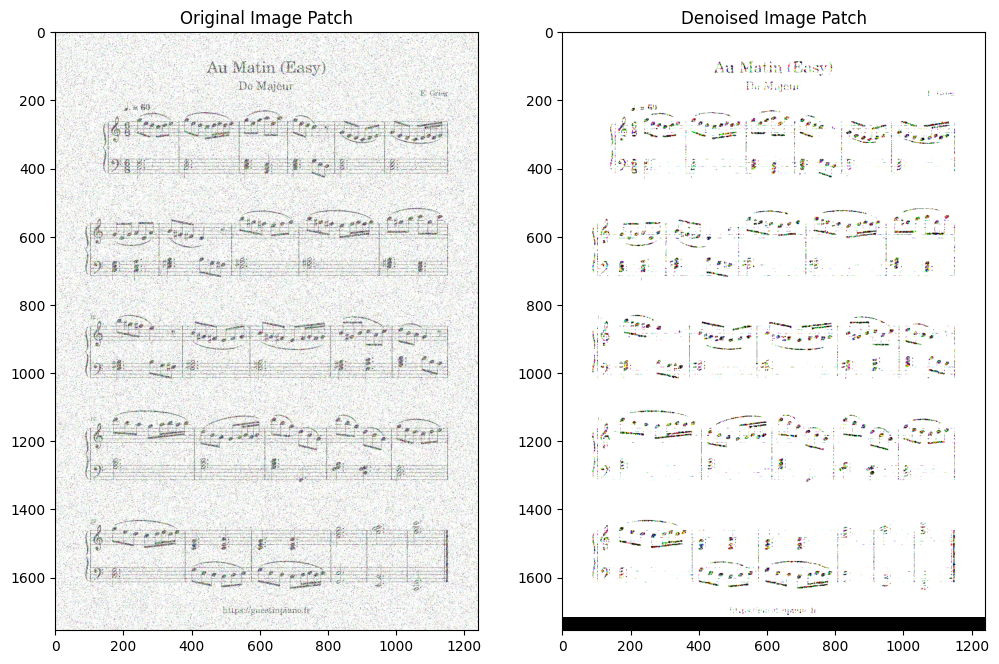

In [ ]:
denoised_image = reconstruct_image(output, noisy_blurry_images[0].shape)
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.title('Original Image Patch')
plt.imshow(noisy_images[0])

# Display the denoised image patch
plt.subplot(1, 2, 2)
plt.title('Denoised Image Patch')
plt.imshow(denoised_image)

plt.show()

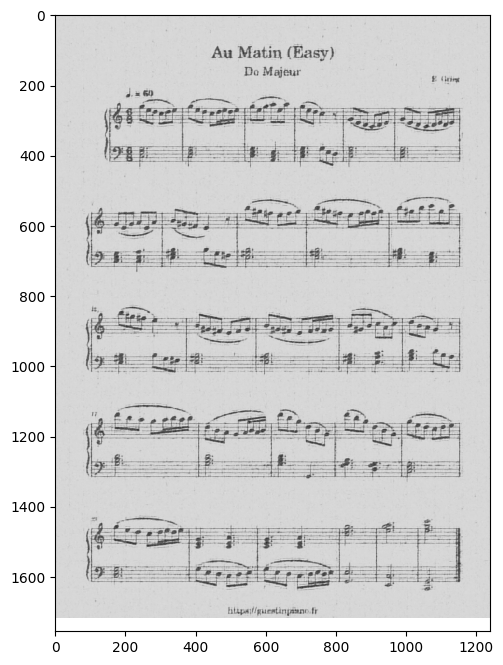

In [ ]:
grayscale_image = np.mean(denoised_image, axis=2)
#grayscale_image[np.isnan(grayscale_image)] = 255
#grayscale_image[grayscale_image > 150] = 255
#grayscale_image[grayscale_image < 60] = 0

plt.figure(figsize=(12, 8))
plt.imshow(grayscale_image, cmap='gist_gray')

## Save the model

In [ ]:
save_path = '/content/drive/My Drive/CV_test/model_nb.h5'

# Save the model to Google Drive
save_model(model, save_path)


<ipython-input-101-3e5cd6bdc023>:4: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  save_model(model, save_path)


## Load a model

In [ ]:
model_path = '/content/drive/My Drive/CV_test/model_nb.h5'

loaded_model = load_model(model_path)

In [ ]:
#get images from folders
images1 = '/content/drive/My Drive/CV_test/varying_noise/'
images2 = '/content/drive/My Drive/CV_test/new_noise/'
jpg = '/content/drive/My Drive/CV_test/jpg/'

images1 = [plt.imread(images1 + filename) for filename in sorted(os.listdir(images1))]
images2 = [plt.imread(images2 + filename) for filename in sorted(os.listdir(images2))]


In [ ]:
denoised_image = get_image(loaded_model, images1[8])

<ipython-input-11-ea1e942345e7>:18: RuntimeWarning: invalid value encountered in divide
  return reconstructed_image / patch_counts


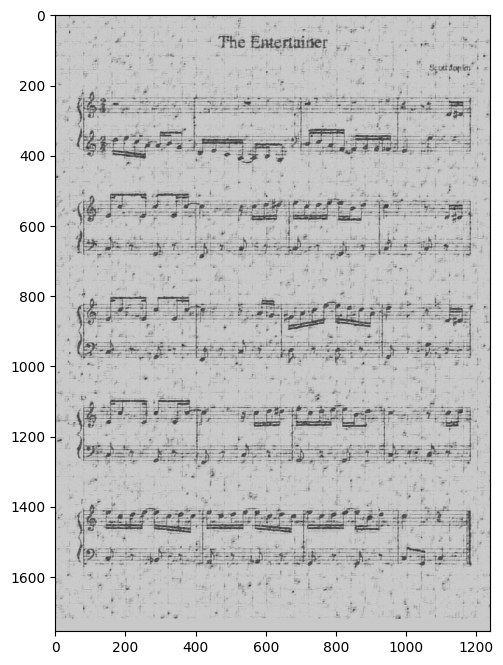

In [ ]:
#denoised_image = fix_image(denoised_image)
new = np.mean(denoised_image, axis=2)
new[np.isnan(new)] = 255

plt.figure(figsize=(12, 8))
plt.imshow(new, cmap='gist_gray')

In [ ]:
from PIL import Image

pil_image = Image.fromarray(new)
pil_image = pil_image.convert('RGB')
file_path = 'The_Entertainer_0_model2.jpg';
pil_image.save(file_path)

#For new Entertainer noisy images, trained with model_n:
#0 -> varying 0, #1 -> varying 1, #2 -> new noise

In [ ]:
images_folder = '/content/drive/My Drive/CV_test/Real Photos with Initial Processing/'

x = sorted(os.listdir(images_folder))

In [ ]:
for filename in x:
    image = plt.imread(images_folder + filename)
    image = np.array([image, image, image]).transpose(1, 2, 0)
    if image.shape[0] > 1800:
        h, w = image.shape[:2]
        scale = (1800 / h)
        image = Image.fromarray(image).resize((int(w * scale), int(h * scale)))
        image = np.array(image)
    denoised_image = get_image(loaded_model, image)
    new = np.mean(denoised_image, axis=2)
    new[np.isnan(new)] = 255
    pil_image = Image.fromarray(new)
    pil_image = pil_image.convert('RGB')
    file_path = f'model2_{filename}';
    pil_image.save(file_path)

# First run took 847 seconds


<ipython-input-5-ea1e942345e7>:18: RuntimeWarning: invalid value encountered in divide
  return reconstructed_image / patch_counts


In [ ]:
z = '/content/drive/My Drive/CV_test/'
img1 = z + 'the_entertainer_model1_noise_only.jpg'
img2 = z + 'the_entertainer_model1_noise_blur.jpg'
img3 = z + 'the_entertainer_model2_noise_only.jpg'
img4 = z + 'the_entertainer_model2_noise_blur.jpg'
photos = [noisy_images[8], noisy_blurry_images[8], plt.imread(img1), plt.imread(img2), plt.imread(img3), plt.imread(img4)]

In [ ]:
print(noise_only[8])

/


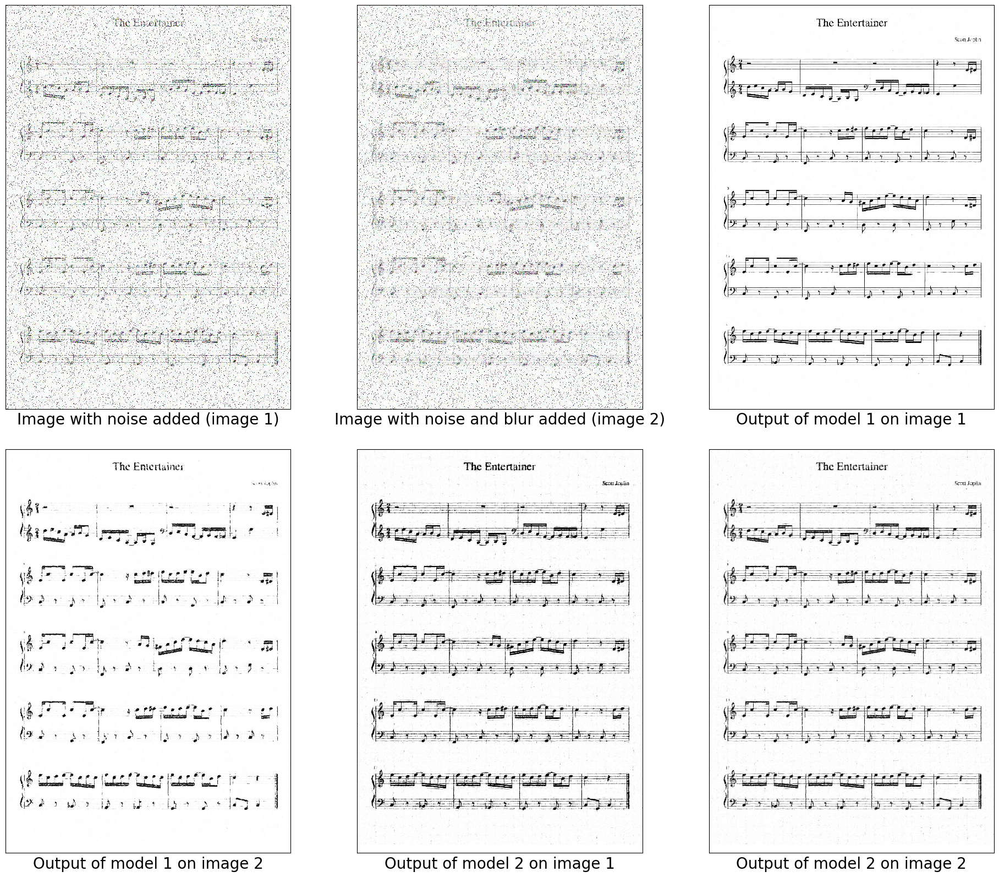

In [ ]:
# Data - you can replace these with your own image paths

images = [noise_only[8], noise_blur[8], ]

# Titles and captions for each image

captions = [
    "Image with noise added (image 1)",
    "Image with noise and blur added (image 2)",
    "Output of model 1 on image 1",
    "Output of model 1 on image 2",
    "Output of model 2 on image 1",
    "Output of model 2 on image 2"
]

fig, axs = plt.subplots(2, 3, figsize=(24, 20))

# Loop through each image and plot it with its title and caption
for i, (img, caption) in enumerate(zip(photos, captions)):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    ax.imshow(img, cmap='gray', interpolation='none')
    ax.set_xlabel(caption)
    ax.set_xticks([])  # Remove x ticks
    ax.set_yticks([])  # Remove y ticks
    ax.set_xlabel(caption, fontsize=20)  # Adjust caption fontsize here
    #for spine in ax.spines.values():
    #    spine.set_visible(False)  # Hide spines
    # Set aspect ratio of the subplot to match the image

plt.subplots_adjust(wspace=0.1, hspace=0.1)  # Adjust spacing between subplots
plt.show()


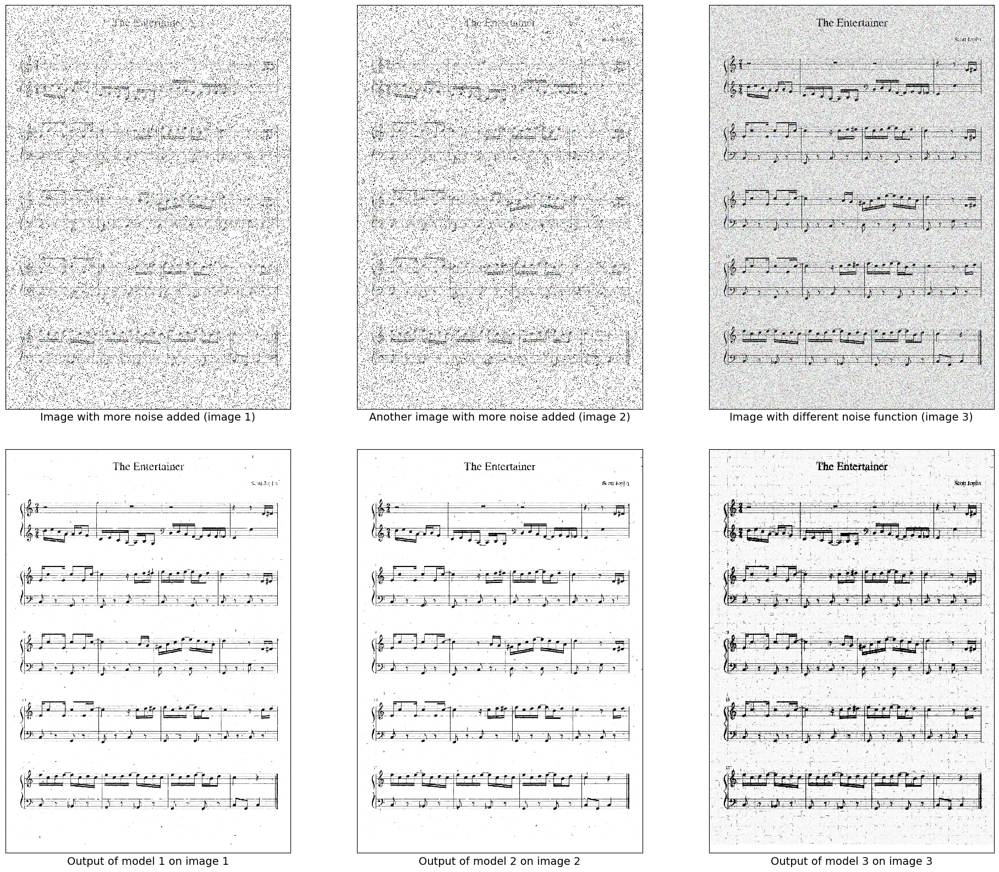

In [ ]:
# Data - you can replace these with your own image paths

z = '/content/drive/My Drive/CV_test/'
img1 = z + 'varying_noise/0_The_Entertainer.jpg'
img2 = z + 'varying_noise/1_The_Entertainer.jpg'
img3 = z + 'new_noise/new_noise_The_Entertainer.jpg'
img4 = z + 'The_Entertainer_Output_0.jpg'
img5 = z + 'The_Entertainer_Output_1.jpg'
img6 = z + 'The_Entertainer_Output_2.jpg'
photos = [plt.imread(img1), plt.imread(img2), plt.imread(img3), plt.imread(img4), plt.imread(img5), plt.imread(img6)]
# Titles and captions for each image

captions = [
    "Image with more noise added (image 1)",
    "Another image with more noise added (image 2)",
    "Image with different noise function (image 3)",
    "Output of model 1 on image 1",
    "Output of model 2 on image 2",
    "Output of model 3 on image 3"
]

fig, axs = plt.subplots(2, 3, figsize=(24, 20))

# Loop through each image and plot it with its title and caption
for i, (img, caption) in enumerate(zip(photos, captions)):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    ax.imshow(img, cmap='gray', interpolation='none')
    ax.set_xlabel(caption)
    ax.set_xticks([])  # Remove x ticks
    ax.set_yticks([])  # Remove y ticks
    ax.set_xlabel(caption, fontsize=14)  # Adjust caption fontsize here
    #for spine in ax.spines.values():
    #    spine.set_visible(False)  # Hide spines
    # Set aspect ratio of the subplot to match the image

plt.subplots_adjust(wspace=0.1, hspace=0.1)  # Adjust spacing between subplots
plt.show()


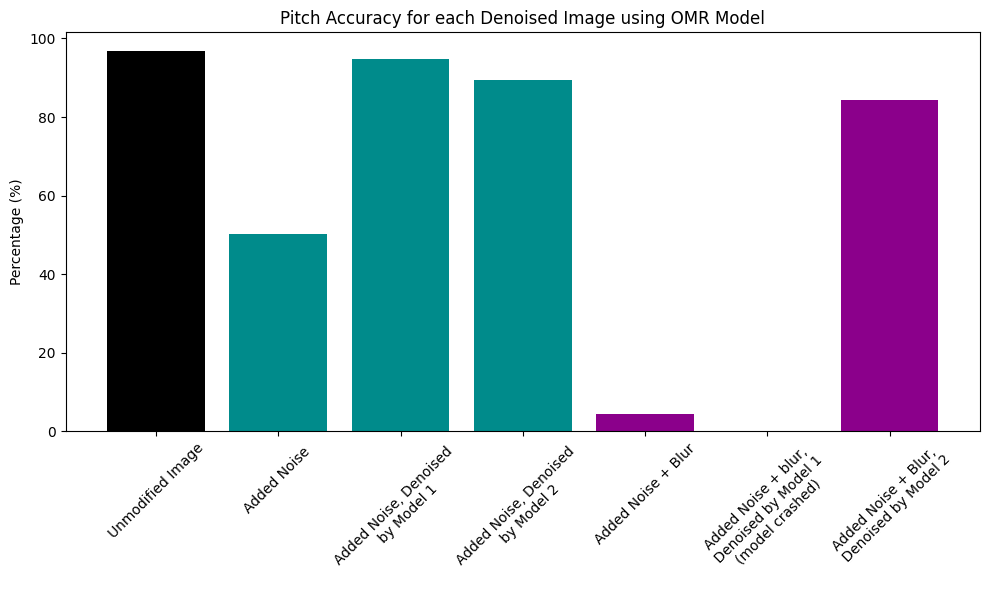

In [ ]:
categories = ['Unmodified Image', 'Added Noise ', 'Added Noise, Denoised \n by Model 1', 'Added Noise, Denoised \n by Model 2', 'Added Noise + Blur', 'Added Noise + blur,\n Denoised by Model 1\n(model crashed)', 'Added Noise + Blur,\n Denoised by Model 2']
values = [96.73, 50.33, 94.77, 89.54, 4.53, 0, 84.31]

# Create bar graph
plt.figure(figsize=(10, 6))
colors = ['black', 'darkcyan', 'darkcyan', 'darkcyan', 'darkmagenta', 'darkmagenta', 'darkmagenta']
plt.bar(categories, values, color=colors)


# Adding labels and title
plt.ylabel('Percentage (%)')
plt.title('Pitch Accuracy for each Denoised Image using OMR Model')

# Show plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout for better spacing
plt.show()